In [2]:
from pathlib import Path
import re, itertools
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


In [1]:
import jax, jax.numpy as jnp
print("Devices:", jax.devices())   # should list your V100

# quick test
x = jnp.ones((2,2))
print("tanh(x):", jnp.tanh(x))


Devices: [CudaDevice(id=0)]
tanh(x): [[0.7615942 0.7615942]
 [0.7615942 0.7615942]]


In [3]:
clim_dir   = Path("/home/sbk29/data/AR/train")
expert_dir = Path("/home/sbk29/data/AR/ar_count_files")

clim_files   = sorted(clim_dir.glob("*.nc"))          # many files (1-per-day)
expert_files = sorted(expert_dir.glob("*.nc"))        # 7 big files


In [4]:
climatenet0 = xr.open_dataset(clim_files[0])

In [5]:
climatenet0

<xarray.Dataset> Size: 64MB
Dimensions:  (lat: 768, lon: 1152, time: 1)
Coordinates:
  * lat      (lat) float64 6kB -90.0 -89.77 -89.53 -89.3 ... 89.53 89.77 90.0
  * lon      (lon) float64 9kB 0.0 0.3125 0.625 0.9375 ... 359.1 359.4 359.7
  * time     (time) <U23 92B 'data-1996-06-09-01-1.nc'
Data variables: (12/17)
    TMQ      (time, lat, lon) float32 4MB ...
    U850     (time, lat, lon) float32 4MB ...
    V850     (time, lat, lon) float32 4MB ...
    UBOT     (time, lat, lon) float32 4MB ...
    VBOT     (time, lat, lon) float32 4MB ...
    QREFHT   (time, lat, lon) float32 4MB ...
    ...       ...
    TS       (time, lat, lon) float32 4MB ...
    TREFHT   (time, lat, lon) float32 4MB ...
    Z1000    (time, lat, lon) float32 4MB ...
    Z200     (time, lat, lon) float32 4MB ...
    ZBOT     (time, lat, lon) float32 4MB ...
    LABELS   (lat, lon) int64 7MB ...

In [9]:
expert7 = xr.open_dataset("/home/sbk29/data/AR/ar_count_files/ar_counts_eid_7.nc")

In [10]:
expert7

<xarray.Dataset> Size: 456MB
Dimensions:    (time: 274, lat: 361, lon: 576, max_count: 20)
Coordinates:
  * time       (time) datetime64[ns] 2kB 2008-01-06 ... 2009-12-31T09:00:00
  * lat        (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.5 89.0 89.5 90.0
  * lon        (lon) float64 5kB -180.0 -179.4 -178.8 ... 178.1 178.8 179.4
Dimensions without coordinates: max_count
Data variables:
    IVT        (time, lat, lon) float64 456MB ...
    AR_COUNT   (time) int32 1kB ...
    click_x    (time, max_count) float64 44kB ...
    click_y    (time, max_count) float64 44kB ...
    click_lat  (time, max_count) float64 44kB ...
    click_lon  (time, max_count) float64 44kB ...
Attributes:
    originating_script:  /project/projectdirs/m1517/cascade/taobrien/artmip/t...
    repository:          https://bitbucket.org/taobrienlbl/ar_count_interface
    git_sha:             2ebec05

In [7]:
# ── NEW helper ──────────────────────────────────────────────────────────────
# Captures four groups: YYYY-MM-DD-HH
name_pat = re.compile(r"(\d{4})-(\d{2})-(\d{2})-(\d{2})")

def date_from_fname(path: Path) -> pd.Timestamp:
    """
    'data-1996-06-09-01-1_0.nc'  →  1996-06-09  (time ignored)
    """
    m = name_pat.search(path.stem)
    if not m:
        raise ValueError(f"Cannot parse date in {path.name}")
    y, mth, d, _ = map(int, m.groups())
    return pd.Timestamp(year=y, month=mth, day=d)  

In [8]:
clim_by_date = {date_from_fname(f): f  for f in clim_files}


In [11]:
clim_by_date

{Timestamp('1996-06-09 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1996-06-09-01-1_0.nc'),
 Timestamp('1996-07-11 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1996-07-11-01-1_0.nc'),
 Timestamp('1996-07-18 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1996-07-18-01-1_2.nc'),
 Timestamp('1996-09-01 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1996-09-01-01-1_1.nc'),
 Timestamp('1996-09-12 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1996-09-12-01-1_0.nc'),
 Timestamp('1996-09-26 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1996-09-26-01-1_1.nc'),
 Timestamp('1996-10-03 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1996-10-03-01-1_1.nc'),
 Timestamp('1997-06-01 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1997-06-01-01-1_0.nc'),
 Timestamp('1997-06-02 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1997-06-02-01-1_0.nc'),
 Timestamp('1997-06-05 00:00:00'): PosixPath('/home/sbk29/data/AR/train/data-1997-06-05-01-

In [12]:
clim_by_date = {}
for f in clim_files:
    date_only = date_from_fname(f)            # 1996-06-09
    clim_by_date.setdefault(date_only, []).append(f)

In [13]:
clim_by_date

{Timestamp('1996-06-09 00:00:00'): [PosixPath('/home/sbk29/data/AR/train/data-1996-06-09-01-1_0.nc')],
 Timestamp('1996-07-11 00:00:00'): [PosixPath('/home/sbk29/data/AR/train/data-1996-07-11-01-1_0.nc')],
 Timestamp('1996-07-18 00:00:00'): [PosixPath('/home/sbk29/data/AR/train/data-1996-07-18-01-1_0.nc'),
  PosixPath('/home/sbk29/data/AR/train/data-1996-07-18-01-1_1.nc'),
  PosixPath('/home/sbk29/data/AR/train/data-1996-07-18-01-1_2.nc')],
 Timestamp('1996-09-01 00:00:00'): [PosixPath('/home/sbk29/data/AR/train/data-1996-09-01-01-1_0.nc'),
  PosixPath('/home/sbk29/data/AR/train/data-1996-09-01-01-1_1.nc')],
 Timestamp('1996-09-12 00:00:00'): [PosixPath('/home/sbk29/data/AR/train/data-1996-09-12-01-1_0.nc')],
 Timestamp('1996-09-26 00:00:00'): [PosixPath('/home/sbk29/data/AR/train/data-1996-09-26-01-1_0.nc'),
  PosixPath('/home/sbk29/data/AR/train/data-1996-09-26-01-1_1.nc')],
 Timestamp('1996-10-03 00:00:00'): [PosixPath('/home/sbk29/data/AR/train/data-1996-10-03-01-1_0.nc'),
  PosixP

In [14]:
pd.Series({d: len(flist) for d, flist in clim_by_date.items()}).value_counts()
# ↳ tells you how many days have 1, 2, 3, … slices


1     90
2     52
3     20
4     10
5      7
6      5
9      3
12     1
Name: count, dtype: int64

In [15]:
def dates_from_expert(path: Path) -> pd.DatetimeIndex:
    with xr.open_dataset(path, engine="netcdf4") as ds:
        return pd.to_datetime(ds["time"].values)
# /home/sbk29/data/AR/ar_count_files/ar_counts_eid_0.nc

In [16]:
expert_ds = {f.stem: xr.open_dataset(f) for f in expert_files}


In [17]:
expert_ds

{'ar_counts_eid_0': <xarray.Dataset> Size: 133MB
 Dimensions:    (time: 80, lat: 361, lon: 576, max_count: 20)
 Coordinates:
   * time       (time) datetime64[ns] 640B 2008-01-02T06:00:00 ... 2009-12-21T...
   * lat        (lat) float64 3kB -90.0 -89.5 -89.0 -88.5 ... 88.5 89.0 89.5 90.0
   * lon        (lon) float64 5kB -180.0 -179.4 -178.8 ... 178.1 178.8 179.4
 Dimensions without coordinates: max_count
 Data variables:
     IVT        (time, lat, lon) float64 133MB ...
     AR_COUNT   (time) int32 320B ...
     click_x    (time, max_count) float64 13kB ...
     click_y    (time, max_count) float64 13kB ...
     click_lat  (time, max_count) float64 13kB ...
     click_lon  (time, max_count) float64 13kB ...
 Attributes:
     originating_script:  /project/projectdirs/m1517/cascade/taobrien/artmip/t...
     repository:          https://bitbucket.org/taobrienlbl/ar_count_interface
     git_sha:             2ebec05,
 'ar_counts_eid_1': <xarray.Dataset> Size: 107MB
 Dimensions:    (time: 

In [18]:
expert_files[1]

PosixPath('/home/sbk29/data/AR/ar_count_files/ar_counts_eid_1.nc')

In [19]:
expert6 = xr.open_dataset(expert_dir/"ar_counts_eid_6.nc")

In [20]:
len(expert6.coords['time'])

133

In [21]:
dates_from_expert(expert_files[6])

DatetimeIndex(['2008-01-04 03:00:00', '2008-01-25 03:00:00',
               '2008-01-25 12:00:00', '2008-02-07 09:00:00',
               '2008-02-12 09:00:00', '2008-02-16 09:00:00',
               '2008-02-28 18:00:00', '2008-03-01 15:00:00',
               '2008-03-04 12:00:00', '2008-03-04 15:00:00',
               ...
               '2009-11-12 06:00:00', '2009-11-13 03:00:00',
               '2009-11-20 09:00:00', '2009-11-25 21:00:00',
               '2009-11-27 03:00:00', '2009-12-01 15:00:00',
               '2009-12-11 03:00:00', '2009-12-16 18:00:00',
               '2009-12-25 00:00:00', '2009-12-29 06:00:00'],
              dtype='datetime64[ns]', length=133, freq=None)

In [22]:
# --- Climatenet (pixelwise) -------------------------------------
clim_by_date = {date_from_fname(f) : f  for f in clim_files}

# --- Experts (pointwise) ----------------------------------------
expert_ds = {f.stem : xr.open_dataset(f) for f in expert_files}  # keep open
expert_dates = set.intersection(*[set(dates_from_expert(f)) for f in expert_files])

# Common dates appearing in both sources
common_dates = sorted(set(clim_by_date).intersection(expert_dates))
print(f"{len(common_dates)} common dates found (e.g. {common_dates[:3]} …)")


0 common dates found (e.g. [] …)


In [23]:
expert_ds = {}
for f in expert_files:
    ds = xr.open_dataset(f)

    # Add a new coordinate called `day`
    #   2008-01-04 03:00:00  →  2008-01-04 00:00:00
    ds = ds.assign_coords(
        day = ds.time.dt.floor('D')      # 2008-01-04 03:00 → 2008-01-04 00:00
)

    expert_ds[f.stem] = ds

In [24]:
next(iter(expert_ds.values())).day.to_index().unique()[:10]
# Out: DatetimeIndex(['2008-01-04', '2008-01-25', '2008-02-07', ...], dtype='datetime64[ns]', freq=None)


DatetimeIndex(['2008-01-02', '2008-01-10', '2008-01-22', '2008-02-07',
               '2008-02-15', '2008-02-16', '2008-02-29', '2008-03-05',
               '2008-03-10', '2008-04-20'],
              dtype='datetime64[ns]', name='time', freq=None)

In [25]:
# 1️⃣  Build a date–only set *for each expert file* -------------------------
expert_day_sets = [
    set(pd.to_datetime(ds.time.values).normalize())
    for ds in expert_ds.values()          # loop over the Datasets
]

# 2️⃣  UNION  – at least one expert has data on that day
expert_days_union = set().union(*expert_day_sets)

# 3️⃣  INTERSECTION – *all* experts have data on that day  (often safer)
expert_days_common = set.intersection(*expert_day_sets)

In [26]:
expert_days_union

{Timestamp('2008-01-01 00:00:00'),
 Timestamp('2008-01-02 00:00:00'),
 Timestamp('2008-01-03 00:00:00'),
 Timestamp('2008-01-04 00:00:00'),
 Timestamp('2008-01-05 00:00:00'),
 Timestamp('2008-01-06 00:00:00'),
 Timestamp('2008-01-08 00:00:00'),
 Timestamp('2008-01-09 00:00:00'),
 Timestamp('2008-01-10 00:00:00'),
 Timestamp('2008-01-11 00:00:00'),
 Timestamp('2008-01-12 00:00:00'),
 Timestamp('2008-01-13 00:00:00'),
 Timestamp('2008-01-14 00:00:00'),
 Timestamp('2008-01-15 00:00:00'),
 Timestamp('2008-01-16 00:00:00'),
 Timestamp('2008-01-17 00:00:00'),
 Timestamp('2008-01-19 00:00:00'),
 Timestamp('2008-01-20 00:00:00'),
 Timestamp('2008-01-21 00:00:00'),
 Timestamp('2008-01-22 00:00:00'),
 Timestamp('2008-01-24 00:00:00'),
 Timestamp('2008-01-25 00:00:00'),
 Timestamp('2008-01-26 00:00:00'),
 Timestamp('2008-01-27 00:00:00'),
 Timestamp('2008-01-28 00:00:00'),
 Timestamp('2008-01-29 00:00:00'),
 Timestamp('2008-01-30 00:00:00'),
 Timestamp('2008-01-31 00:00:00'),
 Timestamp('2008-02-

In [27]:
for name, ds in expert_ds.items():
    days = pd.to_datetime(ds.time.values).normalize()      # YYYY-MM-DD only
    print(f"{name:15s}  →  {len(days.unique()):3d} days   "
          f"{days.min().date()}  →  {days.max().date()}")
# build a frequency counter across all 7 sets
from collections import Counter
day_counter = Counter(day for s in expert_day_sets for day in s)

# e.g. days annotated by ≥4 experts
common4 = sorted([d for d, n in day_counter.items() if n >= 4])
print(f"{len(common4)} days have ≥4 expert annotations")
N = 1                                               # pick threshold
expert_days_N = [d for d, n in day_counter.items() if n >= N]
common_dates = sorted(set(clim_by_date).intersection(expert_days_N))


ar_counts_eid_0  →   76 days   2008-01-02  →  2009-12-21
ar_counts_eid_1  →   60 days   2008-01-01  →  2009-12-30
ar_counts_eid_2  →   85 days   2008-01-09  →  2009-12-22
ar_counts_eid_3  →   45 days   2008-01-28  →  2009-12-23
ar_counts_eid_4  →  195 days   2008-01-04  →  2009-12-31
ar_counts_eid_5  →  548 days   2008-01-01  →  2009-12-31
ar_counts_eid_6  →  117 days   2008-01-04  →  2009-12-29
ar_counts_eid_7  →  241 days   2008-01-06  →  2009-12-31
45 days have ≥4 expert annotations


In [28]:
common_dates

[Timestamp('2008-06-18 00:00:00'),
 Timestamp('2008-07-02 00:00:00'),
 Timestamp('2008-07-15 00:00:00'),
 Timestamp('2008-07-29 00:00:00'),
 Timestamp('2008-08-20 00:00:00'),
 Timestamp('2008-09-19 00:00:00'),
 Timestamp('2008-09-20 00:00:00'),
 Timestamp('2008-10-03 00:00:00'),
 Timestamp('2008-10-12 00:00:00'),
 Timestamp('2009-06-02 00:00:00'),
 Timestamp('2009-06-15 00:00:00'),
 Timestamp('2009-06-27 00:00:00'),
 Timestamp('2009-07-15 00:00:00'),
 Timestamp('2009-07-27 00:00:00'),
 Timestamp('2009-08-02 00:00:00'),
 Timestamp('2009-08-19 00:00:00'),
 Timestamp('2009-08-31 00:00:00'),
 Timestamp('2009-09-02 00:00:00'),
 Timestamp('2009-09-06 00:00:00'),
 Timestamp('2009-09-27 00:00:00'),
 Timestamp('2009-10-09 00:00:00'),
 Timestamp('2009-10-16 00:00:00'),
 Timestamp('2009-10-22 00:00:00')]

In [29]:
MASK_VAR = "LABELS"                      # mask variable confirmed

def daily_clim_mask(files):
    """
    Logical-OR of all Climatenet mask slices for one day.
    Adds a dummy 'time' dim so xr.concat works even though LABELS
    is 2-D (lat, lon) in each file.
    """
    # --- make sure we always iterate over a list ------------------------
    if isinstance(files, (str, Path)):
        files = [files]
    ar_list = []
    for f in files:
        da = xr.open_dataset(f)[MASK_VAR]            # (lat, lon)
        da = da.expand_dims(time=[0])                # ➜ (time=1, lat, lon)
        ar_list.append(da)

    # concat along the new 'time', then union via .max("time")
    return xr.concat(ar_list, dim="time").max("time")



In [29]:
mask = daily_clim_mask(clim_by_date[common_dates[10]])

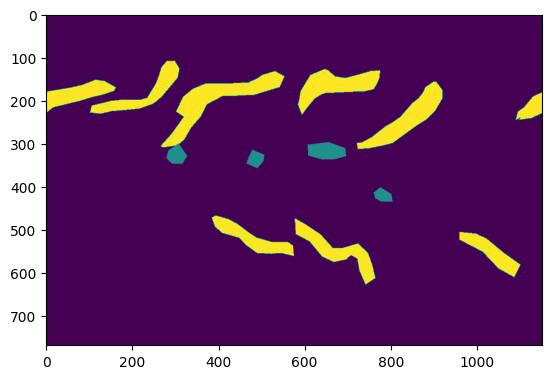

In [30]:
plt.imshow(mask)

AttributeError: AxesImage.set() got an unexpected keyword argument 'map'

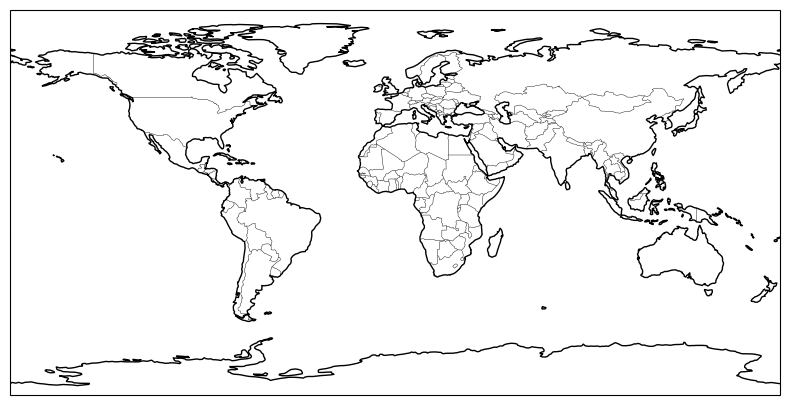

In [85]:
# 2 ▶ map canvas
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(10, 5), subplot_kw=dict(projection=proj))
ax.set_global()
ax.coastlines()
ax.add_feature(cfeature.BORDERS, lw=0.3)

# 3 ▶ draw segmentation mask
mask.plot.imshow(
ax=ax, transform=proj,
map="Blues", alpha=0.35, add_colorbar=False
)

In [75]:
import numpy as np
from pathlib import Path
import itertools
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt

ValueError: operands could not be broadcast together with shapes (576,) (361,) 

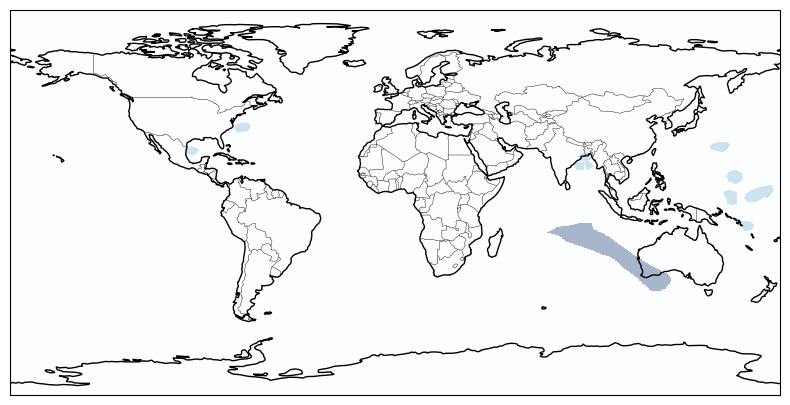

In [ ]:
# colour/marker cycler for up to 7 experts
marker_cycle = itertools.cycle(["o", "s", "^", "v", "D", "P", "X"])

def plot_day(day, save=False, outdir="overlays"):
    """
    Overlay the Climatenet segmentation (pixels) with all expert point
    locations for a given calendar day (Timestamp, YYYY-MM-DD).
    """
    # 1 ▶ Climatenet – union of every 6-h slice that day
    mask = daily_clim_mask(clim_by_date[day])

    # 2 ▶ map canvas
    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(10, 5), subplot_kw=dict(projection=proj))
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, lw=0.3)

    # 3 ▶ draw segmentation mask
    mask.plot.imshow(
        ax=ax, transform=proj,
        cmap="Blues", alpha=0.35, add_colorbar=False
    )

    # 4 ▶ each expert’s point annotations
    for name, ds in expert_ds.items():
        day_sel = ds.time.dt.floor("D") == day
        if not day_sel.any():          # expert absent on this day
            continue

        sub = ds.sel(time=day_sel)

        # pull lon / lat robustly → 1-D, drop NaNs
        lon = np.asarray(sub["lon"]).ravel()
        lat = np.asarray(sub["lat"]).ravel()
        ok  = ~np.isnan(lon) & ~np.isnan(lat)
        if ok.sum() == 0:
            continue

        ax.scatter(
            lon[ok], lat[ok],
            transform=proj,
            s=28,
            marker=next(marker_cycle),
            edgecolors="k", linewidths=0.4,
            label=name
        )

    ax.set_title(day.strftime("Atmospheric Rivers – %Y-%m-%d"))
    ax.legend(loc="lower left", frameon=True)

    if save:
        Path(outdir).mkdir(exist_ok=True, parents=True)
        fig.savefig(
            Path(outdir) / f"AR_overlay_{day:%Y%m%d}.png",
            dpi=150, bbox_inches="tight"
        )

    plt.show()

# ── EXAMPLE ───────────────────────────────────────────────────────────────
plot_day(common_dates[0])      # visualise the first matched day

# batch-export (uncomment to run)
# for d in common_dates:
#     plot_day(d, save=True)

In [86]:
 # 4 ▶ each expert’s point annotations
for name, ds in expert_ds.items():
    day_sel = ds.time.dt.floor("D") == common_dates[10]
    if not day_sel.any():          # expert absent on this day
        continue

    sub = ds.sel(time=day_sel)

        # pull lon / lat robustly → 1-D, drop NaNs
    lon = np.asarray(sub["lon"]).ravel()
    lat = np.asarray(sub["lat"]).ravel()
    ok  = ~np.isnan(lon) & ~np.isnan(lat)
    if ok.sum() == 0:
        continue

    ax.scatter(
        lon[ok], lat[ok],
        transform=proj,
        s=28,
        marker=next(marker_cycle),
        edgecolors="k", linewidths=0.4,
        label=name
        )

ax.set_title(day.strftime("Atmospheric Rivers – %Y-%m-%d"))
ax.legend(loc="lower left", frameon=True)

# if save:
#     Path(outdir).mkdir(exist_ok=True, parents=True)
#     fig.savefig(
#         ath(outdir) / f"AR_overlay_{day:%Y%m%d}.png",
#         dpi=150, bbox_inches="tight"
#         )

plt.show()

ValueError: operands could not be broadcast together with shapes (576,) (361,) 

In [88]:
# ①  one marker style per expert (up to 7)
marker_cycle = itertools.cycle(["o", "s", "^", "v", "D", "P", "X"])

# ②  helper to turn click_x / click_y ➜ lon / lat ---------------------------
def clicks_to_lonlat(ds, cx, cy):
    """
    Convert pixel indices in `click_x`, `click_y`
    to lon / lat using the dataset grid.
    """
    lon_grid = ds["lon"].values          # shape (lon,)
    lat_grid = ds["lat"].values          # shape (lat,)

    lon = lon_grid[np.clip(cx.astype(int), 0, len(lon_grid) - 1)]
    lat = lat_grid[np.clip(cy.astype(int), 0, len(lat_grid) - 1)]
    return lon, lat

# ③  main plotting function -------------------------------------------------
def plot_day(day, save=False, outdir="overlays"):
    """
    Overlay the daily Climatenet mask with each expert’s AR click locations.
    `day` must be a pandas.Timestamp (YYYY-MM-DD 00:00:00).
    """
    # A. daily union of every Climatenet slice ------------------------------
    mask = daily_clim_mask(clim_by_date[day])

    # B. basic map ----------------------------------------------------------
    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(10, 5), subplot_kw=dict(projection=proj))
    ax.set_global(); ax.coastlines(); ax.add_feature(cfeature.BORDERS, lw=.3)

    mask.plot.imshow(ax=ax, transform=proj,
                     cmap="Blues", alpha=.35, add_colorbar=False)

    # C. loop over experts --------------------------------------------------
    for name, ds in expert_ds.items():
        # select the rows whose *calendar* day matches `day`
        sel = ds.sel(time=ds.time.dt.floor("D") == day)
        if sel.dims["time"] == 0:
            continue          # this expert did not annotate that day

        # collect all clicks for that day (flatten in case >1 time-step)
        cx = np.asarray(sel["click_x"]).ravel()
        cy = np.asarray(sel["click_y"]).ravel()

        # remove NaN placeholders
        ok = ~np.isnan(cx) & ~np.isnan(cy)
        if ok.sum() == 0:
            continue

        lon, lat = clicks_to_lonlat(ds, cx[ok], cy[ok])

        ax.scatter(lon, lat,
                   transform=proj,
                   s=28,
                   marker=next(marker_cycle),
                   edgecolors="k", linewidths=.4,
                   label=name)

    ax.set_title(day.strftime("Atmospheric Rivers – %Y-%m-%d"))
    ax.legend(loc="lower left", frameon=True)

    if save:
        Path(outdir).mkdir(exist_ok=True, parents=True)
        fig.savefig(Path(outdir) / f"AR_overlay_{day:%Y%m%d}.png",
                    dpi=150, bbox_inches="tight")

    plt.show()

/tmp/ipykernel_845400/2453428559.py:38: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  if sel.dims["time"] == 0:
/tmp/ipykernel_845400/2453428559.py:38: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  if sel.dims["time"] == 0:
/tmp/ipykernel_845400/2453428559.py:38: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  if sel.dims["time"] == 0:
/tmp/ipykernel_845400/2453428559.py:38: FutureWarning: The

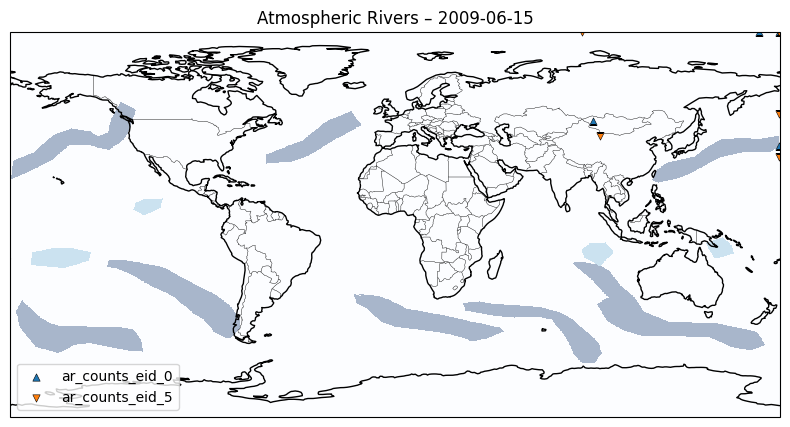

In [90]:
plot_day(common_dates[10])         # quick visual check

# export every matched day
# for d in common_dates:
#     plot_day(d, save=True)


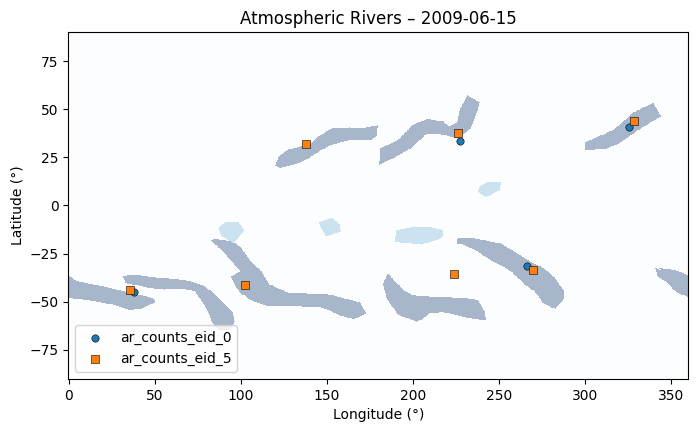

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import itertools

# ------------------------------------------------------------
# helper: union of all Climatenet slices that fall on `day`
MASK_VAR   = "LABELS"                       # climatenet mask variable
def daily_clim_mask(files):
    if isinstance(files, (str, Path)):
        files = [files]                     # allow single-file days

    arrs = []
    for f in files:
        da = xr.open_dataset(f)[MASK_VAR]   # (lat, lon)
        da = da.expand_dims(time=[0])       # make concat happy
        arrs.append(da)

    return xr.concat(arrs, dim="time").max("time")   # logical-OR

# ------------------------------------------------------------
# marker pool for up to 7 experts
marker_cycle = itertools.cycle(["o", "s", "^", "v", "D", "P", "X"])

def plot_day_plain(day, save=False, outdir="overlays_plain"):
    """
    Plot Climatenet pixel mask + expert click locations
    with **no map projection** – everything in native lon/lat space.
    `day`  : pandas.Timestamp, e.g. Timestamp('2008-02-07')
    """
    # 1)  Climatenet mask ---------------------------------------------------
    mask = daily_clim_mask(clim_by_date[day])        # (lat, lon)

    fig, ax = plt.subplots(figsize=(8, 4.5))
    mask.plot.imshow(
        ax=ax, cmap="Blues", alpha=.35,
        add_colorbar=False,  # fewer distractions
    )

    # 2)  Each expert file --------------------------------------------------
    for name, ds in expert_ds.items():
        rows = ds.time.dt.floor("D") == day
        if not rows.any():
            continue

        # prefer explicit lon/lat clicks if they exist ---------------------
        if {"click_lon", "click_lat"}.issubset(ds.data_vars):
            lon = np.asarray(ds["click_lon"].sel(time=rows)).ravel()
            lat = np.asarray(ds["click_lat"].sel(time=rows)).ravel()
        else:  # fall back to pixel indices -> lon/lat
            cx  = np.asarray(ds["click_lon"].sel(time=rows)).ravel()
            cy  = np.asarray(ds["click_lat"].sel(time=rows)).ravel()
            lon = ds["lon"].values[cx.astype(int)]
            lat = ds["lat"].values[cy.astype(int)]

        # strip NaNs & wrap lon to 0-360 so it matches Climatenet ----------
        ok  = ~np.isnan(lon) & ~np.isnan(lat)
        if ok.sum() == 0:
            continue
        lon = (lon[ok] + 360) % 360          # −180…180 → 0…360
        lat =  lat[ok]
        

        ax.scatter(
            lon, lat,
            s=28,
            marker=next(marker_cycle),
            edgecolors="k", linewidths=.4,
            label=name,
        )

    ax.set_xlabel("Longitude (°)")
    ax.set_ylabel("Latitude (°)")
    ax.set_aspect("auto")
    ax.set_title(day.strftime("Atmospheric Rivers – %Y-%m-%d"))
    ax.legend(loc="lower left", frameon=True)

    if save:
        Path(outdir).mkdir(parents=True, exist_ok=True)
        fig.savefig(Path(outdir)/f"AR_overlay_plain_{day:%Y%m%d}.png",
                    dpi=150, bbox_inches="tight")
    plt.show()


# ── EXAMPLE ───────────────────────────────────────────────────────────────
plot_day_plain(common_dates[10])         # quick visual check

# export every matched day
# for d in common_dates:
#     plot_day_plain(d, save=True)


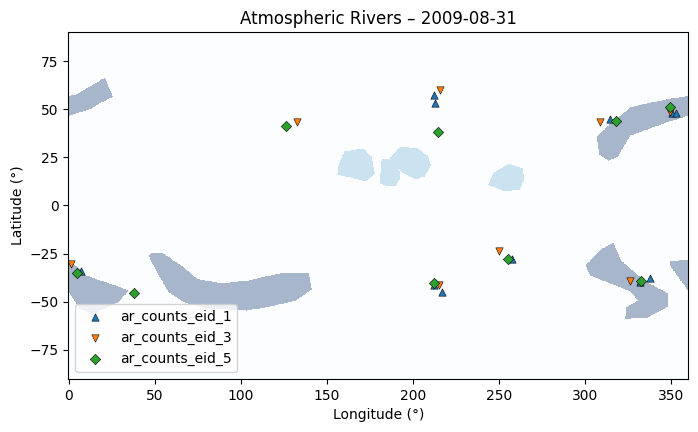

In [32]:
# ── EXAMPLE ───────────────────────────────────────────────────────────────
plot_day_plain(common_dates[16])         # quick visual check


In [30]:
import numpy as np
import pandas as pd

# pick ONE representative Climatenet file and ONE expert Dataset -------------
clim_sample  = xr.open_dataset(next(iter(clim_by_date.values())))
EXPERT_KEY   = next(iter(expert_ds))      # e.g. 'ar_counts_eid_0'
expert_sample = expert_ds[EXPERT_KEY]

def grid_info(ds, lon_name="lon", lat_name="lat"):
    lon = ds[lon_name].values
    lat = ds[lat_name].values
    return {
        "size_lon" : lon.size,
        "min_lon"  : lon.min(),
        "max_lon"  : lon.max(),
        "Δlon (°)" : np.round(np.diff(lon).mean(), 6),
        "size_lat" : lat.size,
        "min_lat"  : lat.min(),
        "max_lat"  : lat.max(),
        "Δlat (°)" : np.round(-np.diff(lat).mean(), 6)   # positive step size
    }

df = pd.DataFrame({
    "Climatenet" : grid_info(clim_sample),
    EXPERT_KEY   : grid_info(expert_sample)
}).T

display(df)


,size_lon,min_lon,max_lon,Δlon (°),size_lat,min_lat,max_lat,Δlat (°)
Climatenet,1152.0,0.0,359.6875,0.3125,768.0,-90.0,90.0,-0.234681
ar_counts_eid_0,576.0,-180.0,179.3750,0.6250,361.0,-90.0,90.0,-0.500000


In [31]:
len(common_dates)

23

/home/sbk29/.conda/envs/turbulence/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


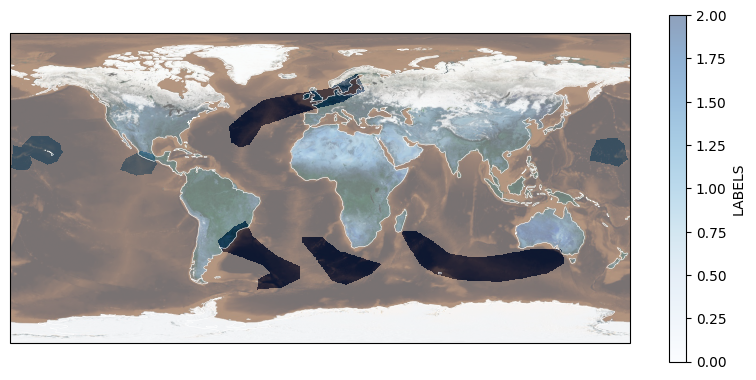

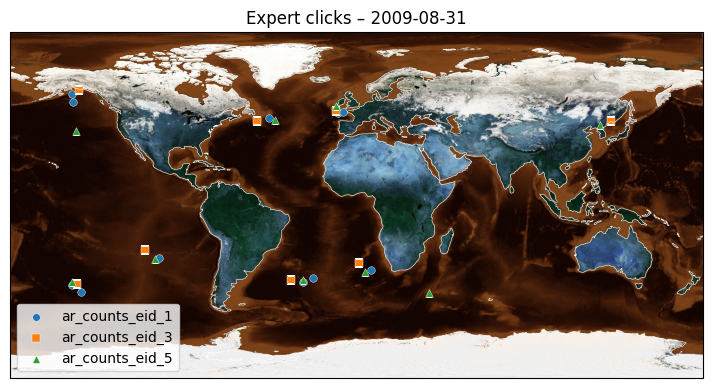

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from pathlib import Path
import rasterio

# ────────────────────────────────────────────────────────────────
# 0 ▸ paths you must set  ✧✧✧ EDIT HERE ✧✧✧
#    BM_PATH  → full path to the Blue-Marble GeoTIFF / JPG / PNG
#    BM_EXTENT→ lon/lat bounds of that file, in degrees
# ----------------------------------------------------------------
BM_PATH    = "/home/sbk29/data/github_AR/AR_detection/climatenet/bluemarble/BM.jpeg"   # your BM image
BM_EXTENT  = (-180.0, 180.0, -90.0, 90.0)            # (lon_min, lon_max, lat_min, lat_max)

# pick one calendar day to visualise
day = common_dates[16]

# ----------------------------------------------------------------
# 1 ▸ helper – load BM as an array once (cached)
# ----------------------------------------------------------------
def load_bm(path):
    with rasterio.open(path) as src:
        img = src.read()[::-1].transpose(1, 2, 0)   # rasterio → (H,W,C) flip y
    return img / 255.0                              # normalise to 0-1

blue_marble = load_bm(BM_PATH)

# ----------------------------------------------------------------
# 2 ▸ base map plot factory
# ----------------------------------------------------------------
def make_ax(title):
    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(
        figsize=(10, 4.5),
        subplot_kw=dict(projection=proj)
    )
    # draw BM
    ax.imshow(blue_marble,
              origin="upper",
              extent=BM_EXTENT,
              transform=proj)
    ax.set_global()
    ax.coastlines(color="white", linewidth=0.4)   # thin coastline on top
    ax.set_title(title)
    return fig, ax

# ----------------------------------------------------------------
# 3 ▸ figure 1 – mask on BM
# ----------------------------------------------------------------
mask = daily_clim_mask(clim_by_date[day])         # DataArray (lat, lon 0-360)

fig1, ax1 = make_ax(day.strftime("Climatenet mask – %Y-%m-%d"))
# draw mask (tell cartopy the data's lon axis is 0…360)
mask.plot.imshow(ax=ax1,
                 transform=ccrs.PlateCarree(),
                 cmap="Blues",
                 alpha=0.45,
                 add_colorbar=True)
plt.show()

# ----------------------------------------------------------------
# 4 ▸ figure 2 – expert clicks on BM
# ----------------------------------------------------------------
fig2, ax2 = make_ax(day.strftime("Expert clicks – %Y-%m-%d"))

marker_cycle = iter(["o", "s", "^", "v", "D", "P", "X"])
for name, ds in expert_ds.items():
    rows = ds.time.dt.floor("D") == day
    if not rows.any():
        continue

    # lon–lat extraction (preferring click_lon / click_lat if present)
    if {"click_lon", "click_lat"}.issubset(ds.data_vars):
        lon = np.asarray(ds["click_lon"].sel(time=rows)).ravel()
        lat = np.asarray(ds["click_lat"].sel(time=rows)).ravel()
    else:
        cx = np.asarray(ds["click_x"].sel(time=rows)).ravel()
        cy = np.asarray(ds["click_y"].sel(time=rows)).ravel()
        lon_grid, lat_grid = ds["lon"].values, ds["lat"].values
        lon = lon_grid[cx.astype(int)]
        lat = lat_grid[cy.astype(int)]

    ok = ~np.isnan(lon) & ~np.isnan(lat)
    if ok.sum() == 0:
        continue

    # wrap −180…180 → 0…360 to align with mask
    lon = (lon[ok] + 360) % 360
    lat =  lat[ok]

    ax2.scatter(
        lon, lat,
        transform=ccrs.PlateCarree(),
        s=30,
        marker=next(marker_cycle),
        edgecolors="white",
        linewidths=0.3,
        label=name
    )

ax2.legend(loc="lower left", frameon=True)
plt.show()


/home/sbk29/.conda/envs/turbulence/lib/python3.12/site-packages/rasterio/__init__.py:356: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


/tmp/ipykernel_2461358/1813146327.py:117: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="lower left", frameon=True)


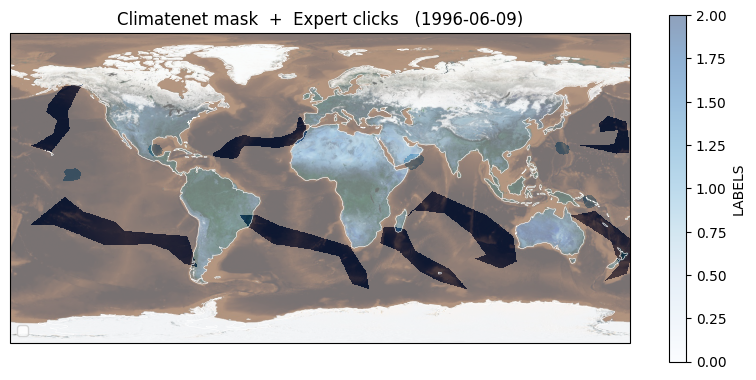

In [32]:
# ------------------------------------------------------------
# imports (only std scientific stack)
# ------------------------------------------------------------
from pathlib import Path
import re, itertools
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import rasterio

# ------------------------------------------------------------
# user paths  ★★★  EDIT HERE  ★★★
# ------------------------------------------------------------
CLIM_DIR   = Path("/home/sbk29/data/AR/train")
EXPERT_DIR = Path("/home/sbk29/data/AR/ar_count_files")
BM_PATH    = Path("/home/sbk29/data/github_AR/AR_detection/climatenet/bluemarble/BM.jpeg")   # blue-marble file
BM_EXTENT  = (-180.0, 180.0, -90.0, 90.0)                  # lon_min, lon_max, lat_min, lat_max
MASK_VAR   = "LABELS"

# ------------------------------------------------------------
# helper – load Blue-Marble once
# ------------------------------------------------------------
def load_bm(path):
    with rasterio.open(path) as src:
        img = src.read()[::-1].transpose(1, 2, 0)  # flip y, (C,H,W)→(H,W,C)
    return img / 255.0

blue_marble = load_bm(BM_PATH)

# ------------------------------------------------------------
# collect Climatenet files grouped by calendar-day
# ------------------------------------------------------------
date_re = re.compile(r"(\d{4})-(\d{2})-(\d{2})")   # YYYY-MM-DD
clim_by_date = {}
for f in CLIM_DIR.glob("*.nc"):
    m = date_re.search(f.stem)
    if not m:
        continue
    d = pd.Timestamp(int(m.group(1)), int(m.group(2)), int(m.group(3)))
    clim_by_date.setdefault(d, []).append(f)

# ------------------------------------------------------------
# open expert files (lazy)
# ------------------------------------------------------------
expert_ds = {p.stem: xr.open_dataset(p) for p in EXPERT_DIR.glob("*.nc")}

# ------------------------------------------------------------
# function: logical-OR of all Clim slices on a day
# ------------------------------------------------------------
def daily_mask(paths):
    if isinstance(paths, (str, Path)):
        paths = [paths]
    da_list = []
    for p in paths:
        da = xr.open_dataset(p)[MASK_VAR]          # (lat, lon 0…360)
        # ★ convert lon coordinate to −180…180 and sort
        new_lon = ((da["lon"] + 180) % 360) - 180
        da = da.assign_coords(lon=new_lon).sortby("lon")
        da_list.append(da.expand_dims(time=[0]))
    return xr.concat(da_list, dim="time").max("time")     # OR-composite

# ------------------------------------------------------------
# helper – click_x/y  → lon/lat   (or use click_lon/lat if present)
# ------------------------------------------------------------
def clicks_lonlat(ds, rows):
    if {"click_lon", "click_lat"}.issubset(ds.data_vars):
        lon = np.asarray(ds["click_lon"].sel(time=rows)).ravel()
        lat = np.asarray(ds["click_lat"].sel(time=rows)).ravel()
    else:
        cx = np.asarray(ds["click_x"].sel(time=rows)).ravel()
        cy = np.asarray(ds["click_y"].sel(time=rows)).ravel()
        lon = ds["lon"].values[cx.astype(int)]
        lat = ds["lat"].values[cy.astype(int)]
    ok = ~np.isnan(lon) & ~np.isnan(lat)
    lon = ((lon[ok] + 180) % 360) - 180          # wrap → −180 … 180
    return lon, lat[ok]

# ------------------------------------------------------------
# main overlay plot
# ------------------------------------------------------------
def overlay_on_bm(day, save=False, outdir=Path("./overlays_bm")):
    if day not in clim_by_date:
        print(f"No Climatenet slices for {day.date()}")
        return

    # map canvas
    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(10, 4.5), subplot_kw=dict(projection=proj))

    # blue-marble background
    ax.imshow(blue_marble, origin="upper", extent=BM_EXTENT, transform=proj)
    ax.set_global()
    ax.coastlines(color="white", linewidth=0.4)

    # Climatenet mask
    m = daily_mask(clim_by_date[day])
    m.plot.imshow(ax=ax, transform=proj,
                  cmap="Blues", alpha=0.45, add_colorbar=True)

    # expert clicks
    markers = itertools.cycle(["o", "s", "^", "v", "D", "P", "X"])
    for name, ds in expert_ds.items():
        rows = ds.time.dt.floor("D") == day
        if not rows.any():
            continue
        lon, lat = clicks_lonlat(ds, rows)
        if len(lon) == 0:
            continue
        ax.scatter(lon, lat, transform=proj,
                   s=30, marker=next(markers),
                   edgecolors="white", linewidths=0.3,
                   label=name)

    ax.set_title(day.strftime("Climatenet mask  +  Expert clicks   (%Y-%m-%d)"))
    ax.legend(loc="lower left", frameon=True)

    if save:
        outdir.mkdir(parents=True, exist_ok=True)
        fig.savefig(outdir / f"AR_overlay_BM_{day:%Y%m%d}.png",
                    dpi=150, bbox_inches="tight")
    plt.show()

# ------------------------------------------------------------
# demo on the first day we have
# ------------------------------------------------------------
first_day = sorted(clim_by_date)[0]
overlay_on_bm(first_day)

# batch-export all days  (uncomment)
# for d in sorted(clim_by_date):
#     overlay_on_bm(d, save=True)


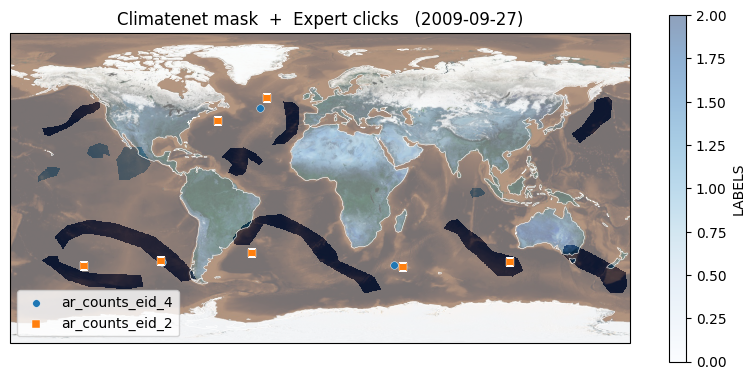

In [33]:
# ------------------------------------------------------------
# demo on the first day we have
# ------------------------------------------------------------

overlay_on_bm(common_dates[19])

# batch-export all days  (uncomment)
# for d in sorted(clim_by_date):
#     overlay_on_bm(d, save=True)

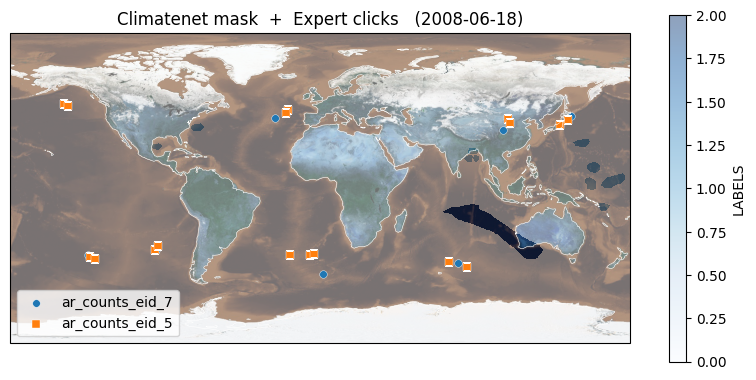

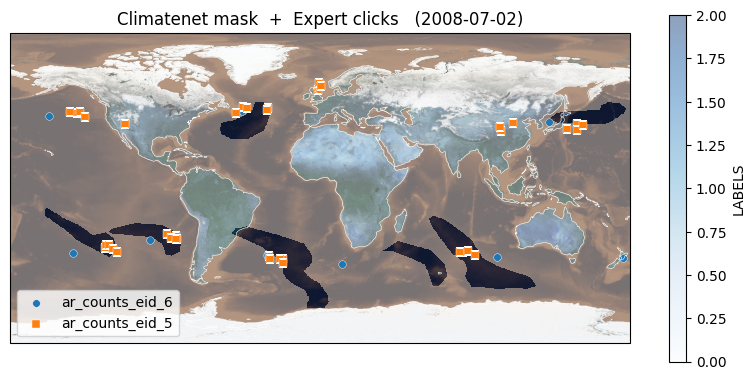

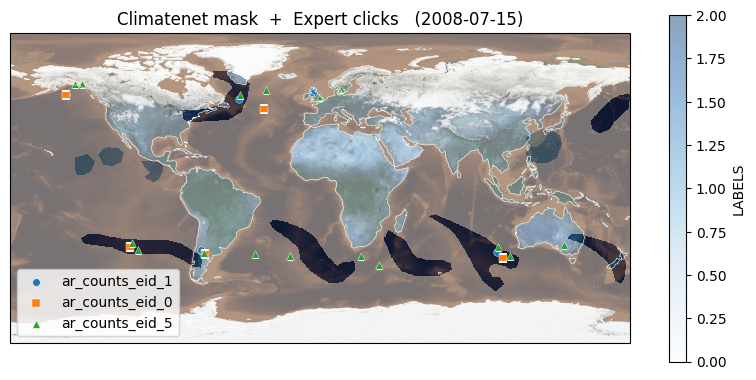

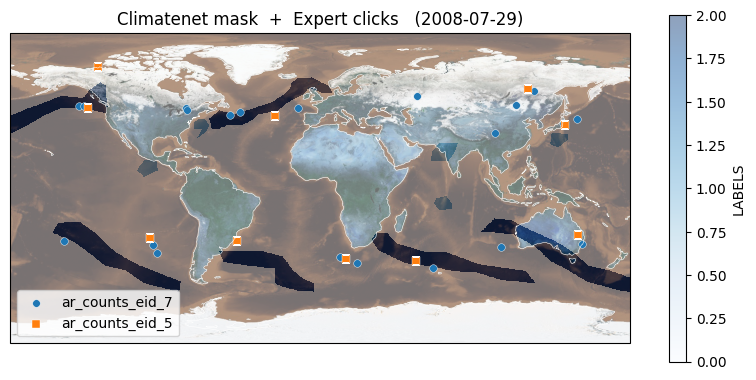

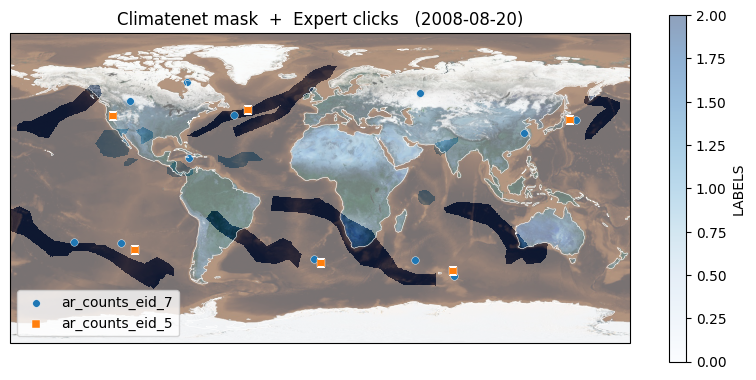

...

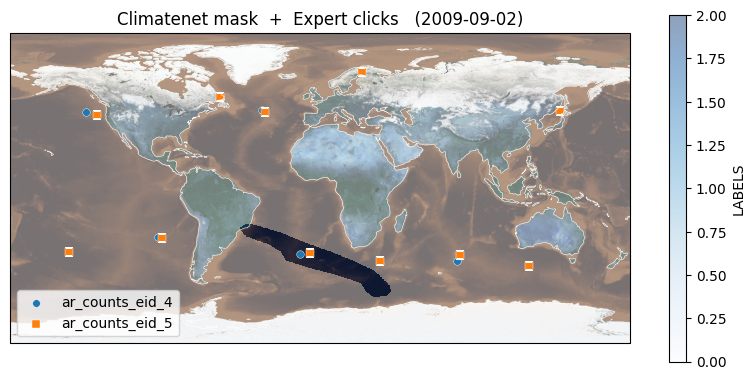

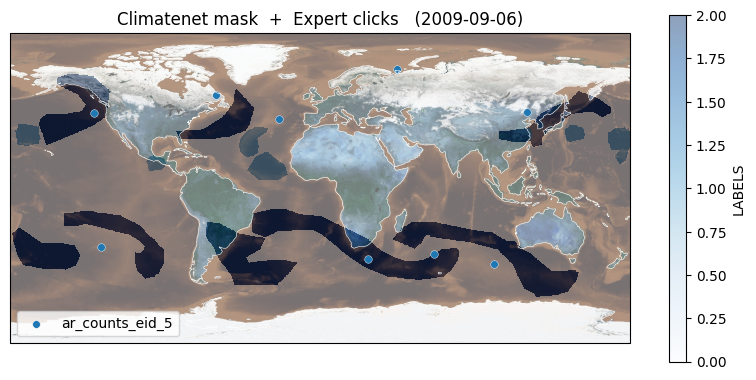

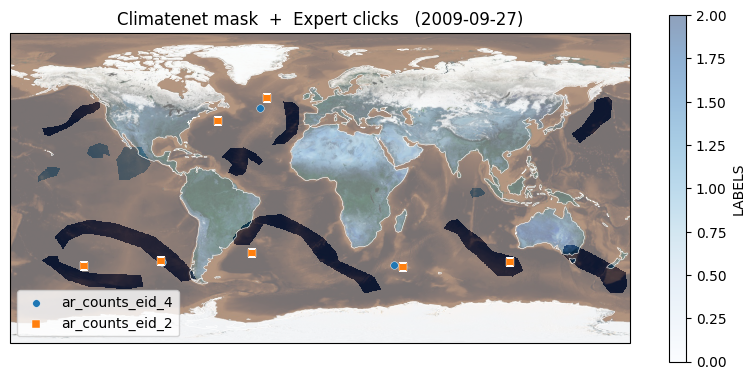

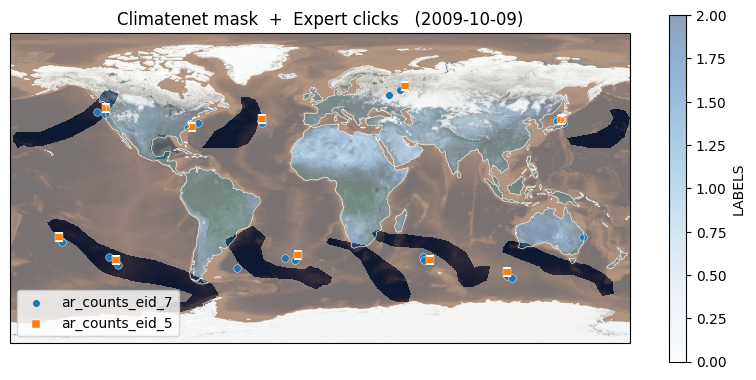

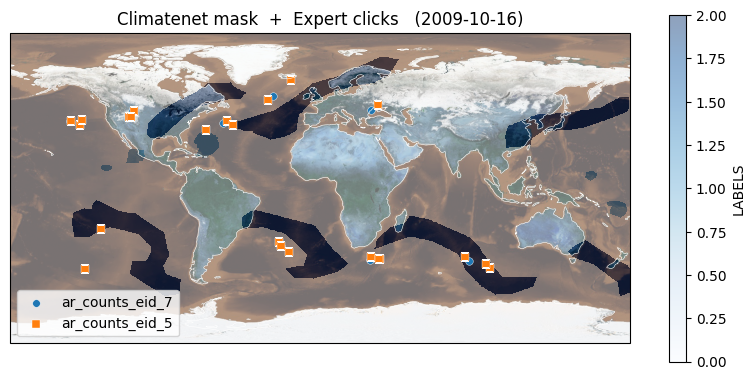

In [36]:
for i in range(22):
    overlay_on_bm(common_dates[i])

In [44]:
def daily_field(paths, var="IVT"):
    """
    Read all slices for a given day, re-wrap lon to −180…180, 
    then take the mean over the day of the given variable.
    """
    if isinstance(paths, (str, Path)):
        paths = [paths]
    da_list = []
    for p in paths:
        ds = xr.open_dataset(p)
        da = ds[var]
        if "time" in da.dims:
            da = da.mean("time")
        new_lon = ((da["lon"] + 180) % 360) - 180
        da = da.assign_coords(lon=new_lon).sortby("lon")
        da_list.append(da)
    return xr.concat(da_list, dim="stack").mean("stack")


def overlay_on_bm_with_field(day,
                             field="IVT",            # <-- change name here
                             cmap="viridis",
                             levels=None,
                             alpha_field=1,
                             save=False,
                             outdir=Path("./overlays_bm")):
    if day not in clim_by_date:
        print(f"No Climatenet slices for {day.date()}")
        return

    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(10, 5),
                           subplot_kw=dict(projection=proj))

    ax.imshow(blue_marble, origin="upper", extent=BM_EXTENT, transform=proj)
    ax.coastlines(color="white", linewidth=0.4)

    # 1) daily mean of chosen field
    da = daily_field(clim_by_date[day], var=field)
    if levels is None:
        vmax = float(da.max())
        levels = np.linspace(0, vmax, 11)
    cf = ax.contourf(da["lon"], da["lat"], da,
                     levels=levels, cmap=cmap, alpha=alpha_field,
                     transform=proj)
    cbar = fig.colorbar(cf, ax=ax, orientation="vertical", pad=0.02)
    cbar.set_label(f"{field} units")

    # 2) OR‐composited mask
    m = daily_mask(clim_by_date[day])
    m.plot.imshow(ax=ax, transform=proj,
                  cmap="Blues", alpha=0.4, add_colorbar=False)

    # 3) Expert clicks
    markers = itertools.cycle(["o","s","^","v","D","P","X"])
    for name, ds in expert_ds.items():
        rows = ds.time.dt.floor("D") == day
        if not rows.any():
            continue
        lon, lat = clicks_lonlat(ds, rows)
        ax.scatter(lon, lat, transform=proj,
                   s=30, marker=next(markers),
                   edgecolors="white", linewidths=0.3,
                   label=name)

    ax.set_title(day.strftime(f"{field} + Climatenet mask + Expert clicks  (%Y-%m-%d)"))
    ax.legend(loc="lower left", frameon=True)

    if save:
        outdir.mkdir(parents=True, exist_ok=True)
        fig.savefig(outdir / f"AR_overlay_{field}_{day:%Y%m%d}.png",
                    dpi=150, bbox_inches="tight")
    plt.show()


/tmp/ipykernel_2461358/2866870390.py:67: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="lower left", frameon=True)


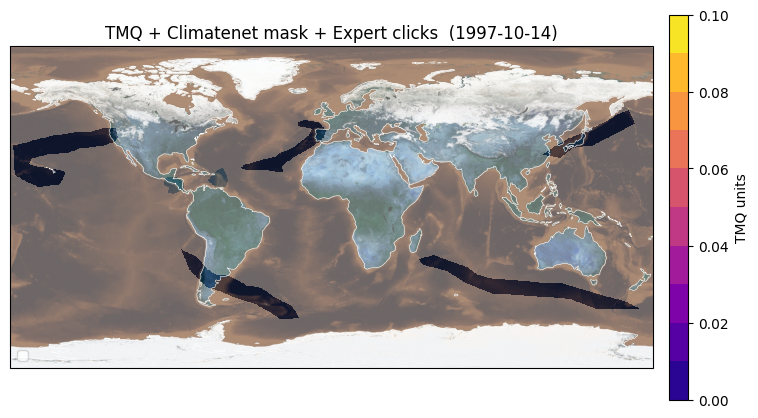

In [45]:
first_day = sorted(clim_by_date)[15]
overlay_on_bm_with_field(first_day, field="TMQ",
                         cmap="plasma", levels=np.linspace(0,0.1,11))
